# Assumption 2 Specific Companies Only

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from numba import jit, njit, vectorize
from glob import glob
import re
import seaborn as sns
import pickle
import joblib
import nltk

import concurrent.futures

pd.set_option('display.max_columns', None) 

%matplotlib inline

In [2]:
dtypes={'JobID': np.str, 'CleanJobTitle': np.str, 'JobDomain': np.str, 
        'CanonCity': np.str, 'CanonCountry': np.str, 'CanonState': np.str, 
        'JobText': np.str, 'JobURL': np.str, 'PostingHTML': np.float64, 
        'Source': np.str, 'JobReferenceID': np.str, 'Email': np.str, 
        'CanonEmployer': np.str, 'Latitude': np.str, 'Longitude': np.str, 
        'CanonIntermediary': np.str, 'Telephone': np.str, 'CanonJobTitle': 'object', 
        'CanonCounty': np.str, 'DivisionCode': np.float64, 'MSA': np.str, 'LMA': np.str,
        'InternshipFlag': np.str, 'ConsolidatedONET': np.str, 'CanonCertification': np.str, 
        'CanonSkillClusters': np.str, 'CanonSkills': np.str, 'IsDuplicate': np.str, 
        'IsDuplicateOf': np.float64, 'CanonMaximumDegree': np.str, 'CanonMinimumDegree': np.str, 
        'CanonOtherDegrees': np.str, 'CanonPreferredDegrees': np.str,
        'CanonRequiredDegrees': np.str, 'CIPCode': np.str, 'StandardMajor': np.str, 
        'MaxExperience': np.float64, 'MinExperience': np.float64, 'ConsolidatedInferredNAICS': np.float64, 
        'BGTOcc': np.str, 'MaxAnnualSalary': np.float64, 'MaxHourlySalary': np.float64, 
        'MinAnnualSalary': np.float64, 'MinHourlySalary': np.float64, 'YearsOfExperience': np.str, 
        'CanonJobHours': np.str, 'CanonJobType': np.str, 'CanonPostalCode': np.str, 
        'CanonYearsOfExperienceCanonLevel': np.str, 'CanonYearsOfExperienceLevel': np.str, 
        'ConsolidatedTitle': np.str, 'Language': np.str, 'BGTSubOcc': np.str, 'JobDate': np.str,
        'ConsolidatedDegreeLevels': np.str, 'MaxDegreeLevel': np.float64, 'MinDegreeLevel': np.float64
                       }

In [3]:
best_list = ['JobID', 'CleanJobTitle', 'CanonCity', 'CanonState', 'JobDate', 'JobText', 'Source', 'CanonEmployer',
             'Latitude', 'Longitude', 'CanonIntermediary', 'CanonJobTitle', 'CanonCounty', 'DivisionCode', 'MSA', 'LMA',
             'InternshipFlag', 'ConsolidatedONET', 'CanonSkillClusters', 'CanonSkills', 'IsDuplicate', 'CanonMinimumDegree', 
             'CanonRequiredDegrees', 'CIPCode', 'MinExperience', 'ConsolidatedInferredNAICS', 'BGTOcc', 'MaxAnnualSalary',
             'MaxHourlySalary', 'MinAnnualSalary', 'MinHourlySalary', 'YearsOfExperience', 'CanonJobHours', 'CanonJobType',
             'CanonPostalCode', 'CanonYearsOfExperienceCanonLevel', 'CanonYearsOfExperienceLevel', 'ConsolidatedTitle', 
             'Language', 'BGTSubOcc', 'ConsolidatedDegreeLevels', 'MaxDegreeLevel', 'MinDegreeLevel']

In [27]:
small_list = ['JobID', 'CleanJobTitle', 'JobDate', 'JobText', 'CanonEmployer', 'Latitude', 'Longitude', 
              'CanonJobTitle', 'DivisionCode', 'MSA', 'LMA', 'ConsolidatedONET', 'CanonSkillClusters', 
              'CanonSkills', 'MinExperience', 'ConsolidatedInferredNAICS', 'BGTOcc', 'CanonJobHours', 
              'CanonJobType', 'CanonYearsOfExperienceLevel', 'ConsolidatedTitle', 'BGTSubOcc'
             ]

In [28]:
%%time

files = glob('/Users/ramonperez/Dropbox/Burning Glass/Analysis/company_data/x_co*.csv') 

# Create a list containing all of the datasets
dfs = [pd.read_csv(f, low_memory=False, parse_dates=['JobDate'], usecols=small_list, dtype=dtypes) for f in files]

# Concatenate all of the datasets into one
df = pd.concat(dfs)
df.reset_index(drop=True, inplace=True)

CPU times: user 28.5 s, sys: 27.2 s, total: 55.7 s
Wall time: 1min 52s


In [29]:
df.head(3)

,BGTOcc,BGTSubOcc,CanonEmployer,CanonJobHours,CanonJobTitle,CanonJobType,CanonSkillClusters,CanonSkills,CanonYearsOfExperienceLevel,CleanJobTitle,ConsolidatedInferredNAICS,ConsolidatedONET,ConsolidatedTitle,DivisionCode,JobDate,JobID,JobText,LMA,Latitude,Longitude,MSA,MinExperience
0,41-2031.00,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Sp...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-25,38201188919,"Sales Associates\n-Foley,AL36535\n-3781 S McKe...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN
1,41-2031.00,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Automotive Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-24,38200222343,"AUTO SALES ASSOCIATES, ENTRY LEVEL\n\nGULF CHR...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN
2,53-7061.00,Detailer,Chrysler,fulltime,Automotive Detailer,permanent,Specialized Skills|Specialized Skills,{'Automotive Services Industry Knowledge': 'Sp...,NaN,Automotive Service Detailer,336111.0,53706100,Automotive Detailer,47664.0,2017-03-20,38198645467,Automotive Service Detailer\n\nChrysler Dealer...,DV264764|MT261982,42.6645,-84.0695,19820: Metropolitan Statistical Area|220: Comb...,NaN


In [30]:
df.shape

(718629, 22)

In [31]:
dict_comps = {
    'Chrysler':'Chrysler',
    'Ford Motor Company':'Ford Motor Company', 
    'JP Morgan Chase Company':'JP Morgan Chase Company', 
    'McKinsey & Company':'McKinsey & Company',
    'Boston Consulting Group Incorporated':'Boston Consulting Group',
    'Boston Consulting Group':'Boston Consulting Group',
    'Bain Company':'Bain Company',
    'Bain Company Incorporated':'Bain Company',
    'General Motors':'General Motors',
    'Microsoft Corporation':'Microsoft Corporation',
    'Citi':'Citi',
    'PepsiCo Inc.':'PepsiCo Inc.',
    'Tyson Foods Incorporated':'Tyson Foods Incorporated',
    'Nestle USA Incorporated':'Nestle USA Incorporated',
    'Bank of America':'Bank of America',
    'The Goldman Sachs Group, Inc.':'The Goldman Sachs Group, Inc.',
    'Morgan Stanley':'Morgan Stanley',
    'Kraft Foods':'Kraft Foods',
    'Anheuser-Busch Companies, Inc.':'Anheuser-Busch Companies, Inc.',
    'Google Inc.':'Google Inc.',
    'Facebook':'Facebook',
    'Twitter':'Twitter',
    'Yahoo':'Yahoo',
    'Chryslerdealer':'Chrysler',
    'Oliver Wyman':'Oliver Wyman',
    'Oliver Wyman, Inc':'Oliver Wyman',
    'Bank Of America Charlotte':'Bank of America',
    'Roland Berger':'Roland Berger',
    'Roland Berger Llc':'Roland Berger',
    'General Motorsgeneral Motors':'General Motors',
    'Facebookadvertisers':'Facebook'
}

In [32]:
df['CanonEmployer'] = df['CanonEmployer'].map(dict_comps)

In [33]:
%%time

df = df[df['JobText'].notna()].copy()

CPU times: user 4.4 s, sys: 26.4 s, total: 30.8 s
Wall time: 1min 29s


In [34]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 718301 entries, 0 to 718628
Data columns (total 22 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   BGTOcc                       645891 non-null  object        
 1   BGTSubOcc                    645870 non-null  object        
 2   CanonEmployer                718301 non-null  object        
 3   CanonJobHours                396003 non-null  object        
 4   CanonJobTitle                410256 non-null  object        
 5   CanonJobType                 397617 non-null  object        
 6   CanonSkillClusters           707773 non-null  object        
 7   CanonSkills                  718301 non-null  object        
 8   CanonYearsOfExperienceLevel  456126 non-null  object        
 9   CleanJobTitle                718211 non-null  object        
 10  ConsolidatedInferredNAICS    713747 non-null  float64       
 11  ConsolidatedONET          

In [35]:
missing_vals = df.isnull().sum() / df.shape[0] * 100
missing_vals

BGTOcc                         10.080732
BGTSubOcc                      10.083656
CanonEmployer                   0.000000
CanonJobHours                  44.869491
CanonJobTitle                  42.885225
CanonJobType                   44.644794
CanonSkillClusters              1.465681
CanonSkills                     0.000000
CanonYearsOfExperienceLevel    36.499323
CleanJobTitle                   0.012530
ConsolidatedInferredNAICS       0.633996
ConsolidatedONET                5.727961
ConsolidatedTitle               0.005569
DivisionCode                   46.570867
JobDate                         0.000000
JobID                           0.000000
JobText                         0.000000
LMA                             1.487956
Latitude                        0.898091
Longitude                       0.898091
MSA                             2.643321
MinExperience                  37.153227
dtype: float64

In [36]:
to_drop = (missing_vals[missing_vals > 70]).index

In [37]:
df.drop(to_drop, axis=1, inplace=True)
df.head(3)

,BGTOcc,BGTSubOcc,CanonEmployer,CanonJobHours,CanonJobTitle,CanonJobType,CanonSkillClusters,CanonSkills,CanonYearsOfExperienceLevel,CleanJobTitle,ConsolidatedInferredNAICS,ConsolidatedONET,ConsolidatedTitle,DivisionCode,JobDate,JobID,JobText,LMA,Latitude,Longitude,MSA,MinExperience
0,41-2031.00,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Sp...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-25,38201188919,"Sales Associates\n-Foley,AL36535\n-3781 S McKe...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN
1,41-2031.00,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Automotive Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-24,38200222343,"AUTO SALES ASSOCIATES, ENTRY LEVEL\n\nGULF CHR...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN
2,53-7061.00,Detailer,Chrysler,fulltime,Automotive Detailer,permanent,Specialized Skills|Specialized Skills,{'Automotive Services Industry Knowledge': 'Sp...,NaN,Automotive Service Detailer,336111.0,53706100,Automotive Detailer,47664.0,2017-03-20,38198645467,Automotive Service Detailer\n\nChrysler Dealer...,DV264764|MT261982,42.6645,-84.0695,19820: Metropolitan Statistical Area|220: Comb...,NaN


In [38]:
companies = df.groupby(['CanonEmployer'])

In [39]:
companies[['BGTOcc','ConsolidatedInferredNAICS', 'ConsolidatedONET']].agg(['count'])

,BGTOcc,ConsolidatedInferredNAICS,ConsolidatedONET
,count,count,count
CanonEmployer,,,
"Anheuser-Busch Companies, Inc.",4298,5005,4703
Bain Company,1013,520,1057
Bank of America,128493,147389,138164
Boston Consulting Group,1765,767,2030
Chrysler,48776,50877,50150
Citi,42399,47884,44461
Facebook,23208,25818,24491
Ford Motor Company,9564,10628,9986


In [40]:
df['BGTOcc'].str.replace('-', '').astype(np.float32).isna().sum()

72410

In [41]:
%%time

df = df[df['BGTOcc'].notna()].copy()

CPU times: user 1.84 s, sys: 9.58 s, total: 11.4 s
Wall time: 24.8 s


In [42]:
df['BGTOcc'] = df['BGTOcc'].str.replace('-', '').astype(np.float32).astype(np.int32)
df['BGTOcc'].head()

0    412031
1    412031
2    537061
3    419041
4    493023
Name: BGTOcc, dtype: int32

# Load Occupations Data

In [43]:
occupations_df = pd.read_csv('/Users/ramonperez/Dropbox/Burning Glass/Analysis/occupations_clean.csv')
occupations_df.head()

,occu_code,occu_text
0,110000,Management Occupations
1,112022,Sales Managers
2,113021,Computer and Information Systems Managers
3,113131,Training and Development Managers
4,119021,Construction Managers


In [44]:
occupations_df.shape

(564, 2)

In [45]:
occupations_df = occupations_df.astype({'occu_code': np.int32})

In [46]:
occupations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564 entries, 0 to 563
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   occu_code  564 non-null    int32 
 1   occu_text  564 non-null    object
dtypes: int32(1), object(1)
memory usage: 6.7+ KB


In [47]:
df.shape

(645891, 22)

In [48]:
new_df = df.merge(occupations_df, left_on='BGTOcc', right_on='occu_code', how='inner')
new_df.head()

,BGTOcc,BGTSubOcc,CanonEmployer,CanonJobHours,CanonJobTitle,CanonJobType,CanonSkillClusters,CanonSkills,CanonYearsOfExperienceLevel,CleanJobTitle,ConsolidatedInferredNAICS,ConsolidatedONET,ConsolidatedTitle,DivisionCode,JobDate,JobID,JobText,LMA,Latitude,Longitude,MSA,MinExperience,occu_code,occu_text
0,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Sp...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-25,38201188919,"Sales Associates\n-Foley,AL36535\n-3781 S McKe...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN,412031,Retail Salespersons
1,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Automotive Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-24,38200222343,"AUTO SALES ASSOCIATES, ENTRY LEVEL\n\nGULF CHR...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN,412031,Retail Salespersons
2,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,mid,Automotive Sales Associate,336111.0,41203100,Sales Associate,16974.0,2017-03-13,38195316884,Automotive Sales Associate\n\nArlington Height...,DV171697|MT171698,41.8792,-87.9747,16980: Metropolitan Statistical Area|176: Comb...,3.0,412031,Retail Salespersons
3,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,mid,Automotive Sales Associate,336111.0,41203100,Sales Associate,20994.0,2017-03-13,38195337619,"Automotive Sales Associate\n\nElgin, Illinois ...",DV171697|MT171698,42.0363,-88.2398,16980: Metropolitan Statistical Area|176: Comb...,3.0,412031,Retail Salespersons
4,412031,Retail Sales Associate (General),Chrysler,fulltime,NaN,permanent,Supply Chain and Logistics: Procurement;Specia...,{'Buying Experience': 'Supply Chain and Logist...,NaN,Automobile Sales & Used,336111.0,41203100,Automobile Sales,NaN,2017-03-14,38195661888,Automobile Sales NEW & USED\n\nJake Sweeney Ch...,MT391714,39.1072,-84.5003,17140: Metropolitan Statistical Area,NaN,412031,Retail Salespersons


In [49]:
new_df.shape

(540143, 24)

In [50]:
companies = new_df.groupby(['CanonEmployer'])
companies['occu_text'].agg(['count'])

,count
CanonEmployer,
"Anheuser-Busch Companies, Inc.",3632
Bain Company,875
Bank of America,102030
Boston Consulting Group,1405
Chrysler,46804
Citi,34659
Facebook,17455
Ford Motor Company,8728
General Motors,25734


In [51]:
new_df.to_csv('~/Dropbox/Burning Glass/Data/comps_occupations_merged.csv', index=False)

# Merged Dataset

In [3]:
%%time

df = pd.read_csv('~/Dropbox/Burning Glass/Data/comps_occupations_merged.csv',
                 low_memory=False, parse_dates=['JobDate'], dtype=dtypes)

# Concatenate all of the datasets into one
df.reset_index(drop=True, inplace=True)
df.head(3)

CPU times: user 19.5 s, sys: 10.1 s, total: 29.6 s
Wall time: 35.6 s


,BGTOcc,BGTSubOcc,CanonEmployer,CanonJobHours,CanonJobTitle,CanonJobType,CanonSkillClusters,CanonSkills,CanonYearsOfExperienceLevel,CleanJobTitle,ConsolidatedInferredNAICS,ConsolidatedONET,ConsolidatedTitle,DivisionCode,JobDate,JobID,JobText,LMA,Latitude,Longitude,MSA,MinExperience,occu_code,occu_text
0,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Sp...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-25,38201188919,"Sales Associates\n-Foley,AL36535\n-3781 S McKe...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN,412031,Retail Salespersons
1,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Automotive Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-24,38200222343,"AUTO SALES ASSOCIATES, ENTRY LEVEL\n\nGULF CHR...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN,412031,Retail Salespersons
2,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,mid,Automotive Sales Associate,336111.0,41203100,Sales Associate,16974.0,2017-03-13,38195316884,Automotive Sales Associate\n\nArlington Height...,DV171697|MT171698,41.8792,-87.9747,16980: Metropolitan Statistical Area|176: Comb...,3.0,412031,Retail Salespersons


In [4]:
path_assumptions = '/Users/ramonperez/Dropbox/Burning Glass/Analysis/assumptions_2/'

# a. For each firm, the number of occupations

In [5]:
comps = list(df['CanonEmployer'].unique())
comps

['Chrysler',
 'Ford Motor Company',
 'JP Morgan Chase Company',
 'McKinsey & Company',
 'Boston Consulting Group',
 'Bain Company',
 'General Motors',
 'Microsoft Corporation',
 'Citi',
 'PepsiCo Inc.',
 'Tyson Foods Incorporated',
 'Nestle USA Incorporated',
 'Bank of America',
 'The Goldman Sachs Group, Inc.',
 'Morgan Stanley',
 'Kraft Foods',
 'Anheuser-Busch Companies, Inc.',
 'Google Inc.',
 'Facebook',
 'Twitter',
 'Yahoo',
 'Oliver Wyman',
 'Roland Berger']

In [6]:
unique_occ_comp = {}
unique_occ_nums = {}

for comp in comps:
    unique_occs = list(df.loc[df['CanonEmployer'] == comp, 'occu_text'].unique())
    number_occs = len(df.loc[df['CanonEmployer'] == comp, 'occu_text'].unique())
    unique_occ_comp[comp] = unique_occs
    unique_occ_nums[comp] = number_occs

In [7]:
from pprint import pprint
pprint(unique_occ_nums)

{'Anheuser-Busch Companies, Inc.': 137,
 'Bain Company': 55,
 'Bank of America': 227,
 'Boston Consulting Group': 81,
 'Chrysler': 254,
 'Citi': 197,
 'Facebook': 247,
 'Ford Motor Company': 155,
 'General Motors': 241,
 'Google Inc.': 170,
 'JP Morgan Chase Company': 242,
 'Kraft Foods': 123,
 'McKinsey & Company': 116,
 'Microsoft Corporation': 210,
 'Morgan Stanley': 134,
 'Nestle USA Incorporated': 209,
 'Oliver Wyman': 30,
 'PepsiCo Inc.': 214,
 'Roland Berger': 4,
 'The Goldman Sachs Group, Inc.': 154,
 'Twitter': 138,
 'Tyson Foods Incorporated': 206,
 'Yahoo': 90}


In [8]:
sample_firm_unique_occu = pd.Series(unique_occ_comp['Kraft Foods'], name='Kraft_Foods')
sample_firm_unique_occu.head()

0                                  Retail Salespersons
1                   Cleaners of Vehicles and Equipment
2         Automotive Service Technicians and Mechanics
3    Sales Representatives, Wholesale and Manufactu...
4    Secretaries and Administrative Assistants, Exc...
Name: Kraft_Foods, dtype: object

In [10]:
sample_firm_unique_occu.to_csv(path_assumptions + 'sample_firm_unique_occu.csv', index=False)

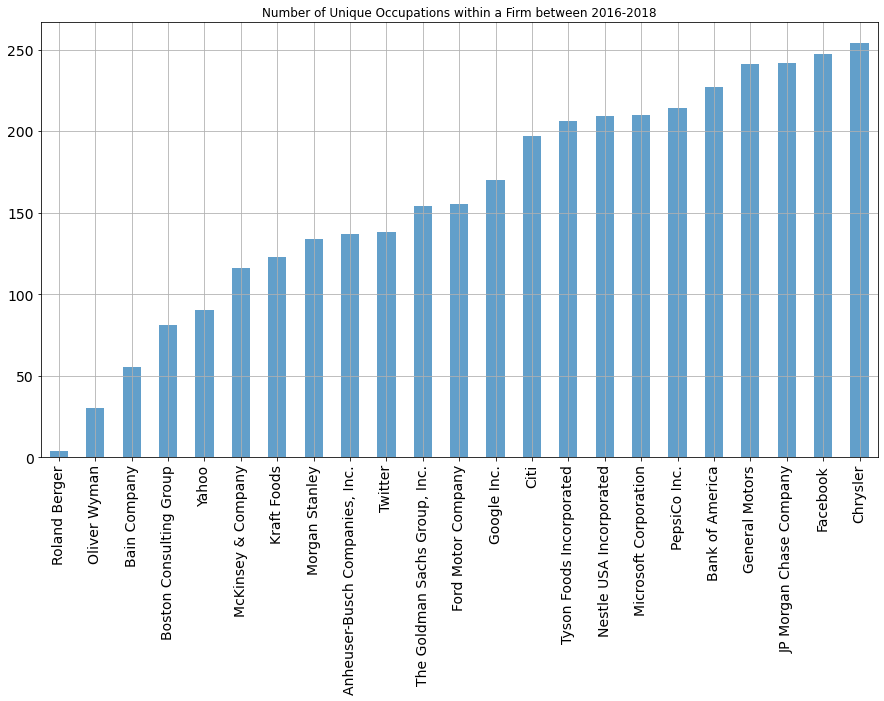

In [11]:
pd.Series(unique_occ_nums).sort_values().plot(kind='bar',
                                              rot=90, 
                                              figsize=(15, 8),
                                              fontsize=14,
                                              title='Number of Unique Occupations within a Firm between 2016-2018',
                                              grid=True,
                                              alpha=0.70);

# b. For each BGTOcc within a company, get the unique number of job titles & names of those job titles

In [12]:
df.columns

Index(['BGTOcc', 'BGTSubOcc', 'CanonEmployer', 'CanonJobHours',
       'CanonJobTitle', 'CanonJobType', 'CanonSkillClusters', 'CanonSkills',
       'CanonYearsOfExperienceLevel', 'CleanJobTitle',
       'ConsolidatedInferredNAICS', 'ConsolidatedONET', 'ConsolidatedTitle',
       'DivisionCode', 'JobDate', 'JobID', 'JobText', 'LMA', 'Latitude',
       'Longitude', 'MSA', 'MinExperience', 'occu_code', 'occu_text'],
      dtype='object')

In [14]:
job_cols = ['CleanJobTitle', 'ConsolidatedTitle', 'CanonJobTitle']

In [15]:
df.loc[df['CanonEmployer'] == 'Facebook', job_cols].sample(50).head(10)

,CleanJobTitle,ConsolidatedTitle,CanonJobTitle
168131,"Sales Finance Manager, Trade Financial Plannin...",Sales Manager,Sales Manager
104960,"Audit Manager, Consumer - Cards",Corporate Paralegal,Audit Manager
533543,A Market-Personal Banker- Financial Cente,Personal Banker,Personal Banker
138331,Delivery Manager Manager,Delivery Manager,NaN
152458,"Coordinator - Human Resources, Flexibility Pro...",Human Resources Coordinator,Human Resources Coordinator
497954,Britain Congregational Church Sbcc Britain,Britain Congregational Church Sbcc Britain,NaN
361480,"Product Marketing Analyst, Smb",Marketing Analyst,Marketing Analyst
132682,Sas/Sql Analytics & Reporting Analyst - Enterp...,"Analytics Reports Analyst, Enterprise,Analytics",NaN
428378,Team Financial Advisor Program Planning,Financial Advisor,Financial Advisor
80441,Senior Big Data Java Engineer - Investor Services,Java Engineer,Java Engineer


In [17]:
%%time

jobs_cols_name_unique = {}
jobs_cols_nums_unique = {}


for comp in comps:
    job_text = {}
    job_nums = {}
    for job in job_cols:
        unique_jobs = list(df.loc[df['CanonEmployer'] == comp, job].unique())
        number_jobs = len(df.loc[df['CanonEmployer'] == comp, job].unique())
        job_text[job] = unique_jobs
        job_nums[job] = number_jobs
    jobs_cols_name_unique[comp] = job_text
    jobs_cols_nums_unique[comp] = job_nums

CPU times: user 3.47 s, sys: 31.2 ms, total: 3.5 s
Wall time: 3.52 s


In [18]:
pprint(jobs_cols_nums_unique)

{'Anheuser-Busch Companies, Inc.': {'CanonJobTitle': 204,
                                    'CleanJobTitle': 1298,
                                    'ConsolidatedTitle': 591},
 'Bain Company': {'CanonJobTitle': 87,
                  'CleanJobTitle': 385,
                  'ConsolidatedTitle': 240},
 'Bank of America': {'CanonJobTitle': 652,
                     'CleanJobTitle': 33461,
                     'ConsolidatedTitle': 6506},
 'Boston Consulting Group': {'CanonJobTitle': 152,
                             'CleanJobTitle': 645,
                             'ConsolidatedTitle': 395},
 'Chrysler': {'CanonJobTitle': 664,
              'CleanJobTitle': 12253,
              'ConsolidatedTitle': 3533},
 'Citi': {'CanonJobTitle': 588,
          'CleanJobTitle': 18569,
          'ConsolidatedTitle': 5352},
 'Facebook': {'CanonJobTitle': 766,
              'CleanJobTitle': 8499,
              'ConsolidatedTitle': 3760},
 'Ford Motor Company': {'CanonJobTitle': 371,
                    

In [ ]:
pprint(jobs_cols_name_unique)

{'Anheuser-Busch Companies, Inc.': {'CanonJobTitle': ['Shop Team Member',
                                                      nan,
                                                      'Shop Associate',
                                                      'Mechanic',
                                                      'Wash Technician',
                                                      'Sales Representative',
                                                      'Field Sales '
                                                      'Representative',
                                                      'Sales Specialist',
                                                      'Sales Trainee',
                                                      'Outside Sales '
                                                      'Representative',
                                                      'Inside Sales '
                                                      'Representative',
       

In [44]:
comps_title_nums = pd.DataFrame.from_dict(jobs_cols_nums_unique).T#.plot(kind='bar')
comps_title_nums.head()

,CleanJobTitle,ConsolidatedTitle,CanonJobTitle
Chrysler,12253,3533,664
Ford Motor Company,4996,1954,371
JP Morgan Chase Company,61038,16745,761
McKinsey & Company,1501,834,195
Boston Consulting Group,645,395,152


In [20]:
pd.DataFrame.from_dict(jobs_cols_name_unique).T.head()

,CleanJobTitle,ConsolidatedTitle,CanonJobTitle
Chrysler,"[Sales Associate, Automotive Sales Associate, ...","[Sales Associate, Automobile Sales, Automobile...","[Sales Associate, nan, Sales Representative, S..."
Ford Motor Company,"[Sales Professional, 2017 Finance - Treasury L...","[Sales Professional, 2017 Finance - Treasury L...","[Sales Professional, nan, Sales Associate, Cus..."
JP Morgan Chase Company,[Treasury Services Sales Associate - Commercia...,"[Sales Associate, Corporate Credit Associate, ...","[Sales Associate, nan, Commercial Underwriter,..."
McKinsey & Company,"[Consultant Analyst - Pre-Sales, Periscope, Di...","[Sales Consultant, Director, Solutions,Deliver...","[Sales Consultant, nan, Sales Specialist, Acco..."
Boston Consulting Group,"[Principal - Retail Pricing, Knowledge Expert-...","[Principal - Retail Pricing, Knowledge Expert-...","[nan, Shop Associate, Marketing Manager, Admin..."


In [21]:
pd.DataFrame(jobs_cols_name_unique['Anheuser-Busch Companies, Inc.']['CanonJobTitle']).head()

,0
0,Shop Team Member
1,NaN
2,Shop Associate
3,Mechanic
4,Wash Technician


In [22]:
data_comps = {}

for key, val in jobs_cols_name_unique.items():
    for key2, val2 in val.items():
        data_comps[key + '_' + key2] = pd.Series(val2)

In [23]:
comps_titles = pd.DataFrame()

for key, val in data_comps.items():
    comps_titles[key] = data_comps

In [24]:
comps_titles = pd.DataFrame(data_comps)
comps_titles.head()

,Chrysler_CleanJobTitle,Chrysler_ConsolidatedTitle,Chrysler_CanonJobTitle,Ford Motor Company_CleanJobTitle,Ford Motor Company_ConsolidatedTitle,Ford Motor Company_CanonJobTitle,JP Morgan Chase Company_CleanJobTitle,JP Morgan Chase Company_ConsolidatedTitle,JP Morgan Chase Company_CanonJobTitle,McKinsey & Company_CleanJobTitle,McKinsey & Company_ConsolidatedTitle,McKinsey & Company_CanonJobTitle,Boston Consulting Group_CleanJobTitle,Boston Consulting Group_ConsolidatedTitle,Boston Consulting Group_CanonJobTitle,Bain Company_CleanJobTitle,Bain Company_ConsolidatedTitle,Bain Company_CanonJobTitle,General Motors_CleanJobTitle,General Motors_ConsolidatedTitle,General Motors_CanonJobTitle,Microsoft Corporation_CleanJobTitle,Microsoft Corporation_ConsolidatedTitle,Microsoft Corporation_CanonJobTitle,Citi_CleanJobTitle,Citi_ConsolidatedTitle,Citi_CanonJobTitle,PepsiCo Inc._CleanJobTitle,PepsiCo Inc._ConsolidatedTitle,PepsiCo Inc._CanonJobTitle,Tyson Foods Incorporated_CleanJobTitle,Tyson Foods Incorporated_ConsolidatedTitle,Tyson Foods Incorporated_CanonJobTitle,Nestle USA Incorporated_CleanJobTitle,Nestle USA Incorporated_ConsolidatedTitle,Nestle USA Incorporated_CanonJobTitle,Bank of America_CleanJobTitle,Bank of America_ConsolidatedTitle,Bank of America_CanonJobTitle,"The Goldman Sachs Group, Inc._CleanJobTitle","The Goldman Sachs Group, Inc._ConsolidatedTitle","The Goldman Sachs Group, Inc._CanonJobTitle",Morgan Stanley_CleanJobTitle,Morgan Stanley_ConsolidatedTitle,Morgan Stanley_CanonJobTitle,Kraft Foods_CleanJobTitle,Kraft Foods_ConsolidatedTitle,Kraft Foods_CanonJobTitle,"Anheuser-Busch Companies, Inc._CleanJobTitle","Anheuser-Busch Companies, Inc._ConsolidatedTitle","Anheuser-Busch Companies, Inc._CanonJobTitle",Google Inc._CleanJobTitle,Google Inc._ConsolidatedTitle,Google Inc._CanonJobTitle,Facebook_CleanJobTitle,Facebook_ConsolidatedTitle,Facebook_CanonJobTitle,Twitter_CleanJobTitle,Twitter_ConsolidatedTitle,Twitter_CanonJobTitle,Yahoo_CleanJobTitle,Yahoo_ConsolidatedTitle,Yahoo_CanonJobTitle,Oliver Wyman_CleanJobTitle,Oliver Wyman_ConsolidatedTitle,Oliver Wyman_CanonJobTitle,Roland Berger_CleanJobTitle,Roland Berger_ConsolidatedTitle,Roland Berger_CanonJobTitle
0,Sales Associate,Sales Associate,Sales Associate,Sales Professional,Sales Professional,Sales Professional,Treasury Services Sales Associate - Commercial...,Sales Associate,Sales Associate,"Consultant Analyst - Pre-Sales, Periscope",Sales Consultant,Sales Consultant,Principal - Retail Pricing,Principal - Retail Pricing,NaN,Americas Knowledge Specialist Consumer Product...,"Specialist, Consumer, Retail Industry",NaN,Automotive Salesassociates,Automotive Salesassociates,NaN,Retail Partner Stores Specialist,"Specialist, Retail Industry",NaN,Retail Services - Digital Product Strategy And...,Retail Services - Digital Product Strategy And...,NaN,Customer Service Merchandiser,Merchandiser,Merchandiser,Associate Sales - Carcass Merchandiser,Sales Associate,Sales Associate,Retail Sales Associate,Retail Sales Associate,Retail Sales Associate,Senior Telephone Sales Associate,Sales Associate,Sales Associate,"Securities, Multi Asset Platform Sales, Ficc E...",Sales Associate,Sales Associate,Ied - Institutional Equity Sales Associate,Sales Associate,Sales Associate,Factory Leadership,Factory Leadership,NaN,Gift Shop Team Member,Shop Team Member,Shop Team Member,At Google,At Google,NaN,"Client Partner, Specialty Retail","Client Partner, Specialty Retail",NaN,Client Partner- Retail,Client Partner- Retail,NaN,Customer Care Associate I,Customer Service Associate,NaN,Cavok - Technical Specialist - Technical Opera...,Operations Specialist,Operations Specialist,Senior Consultant,Senior Consultant,NaN
1,Automotive Sales Associate,Automobile Sales,NaN,2017 Finance - Treasury Leadership Program,2017 Finance - Treasury Leadership Program,NaN,Cib - Na Structured Sales - Associate,"Corporate Credit Associate, Retail Industry",NaN,Director Of Solutions Delivery - Retail,"Director, Solutions,D

In [25]:
comps_titles.tail()

,Chrysler_CleanJobTitle,Chrysler_ConsolidatedTitle,Chrysler_CanonJobTitle,Ford Motor Company_CleanJobTitle,Ford Motor Company_ConsolidatedTitle,Ford Motor Company_CanonJobTitle,JP Morgan Chase Company_CleanJobTitle,JP Morgan Chase Company_ConsolidatedTitle,JP Morgan Chase Company_CanonJobTitle,McKinsey & Company_CleanJobTitle,McKinsey & Company_ConsolidatedTitle,McKinsey & Company_CanonJobTitle,Boston Consulting Group_CleanJobTitle,Boston Consulting Group_ConsolidatedTitle,Boston Consulting Group_CanonJobTitle,Bain Company_CleanJobTitle,Bain Company_ConsolidatedTitle,Bain Company_CanonJobTitle,General Motors_CleanJobTitle,General Motors_ConsolidatedTitle,General Motors_CanonJobTitle,Microsoft Corporation_CleanJobTitle,Microsoft Corporation_ConsolidatedTitle,Microsoft Corporation_CanonJobTitle,Citi_CleanJobTitle,Citi_ConsolidatedTitle,Citi_CanonJobTitle,PepsiCo Inc._CleanJobTitle,PepsiCo Inc._ConsolidatedTitle,PepsiCo Inc._CanonJobTitle,Tyson Foods Incorporated_CleanJobTitle,Tyson Foods Incorporated_ConsolidatedTitle,Tyson Foods Incorporated_CanonJobTitle,Nestle USA Incorporated_CleanJobTitle,Nestle USA Incorporated_ConsolidatedTitle,Nestle USA Incorporated_CanonJobTitle,Bank of America_CleanJobTitle,Bank of America_ConsolidatedTitle,Bank of America_CanonJobTitle,"The Goldman Sachs Group, Inc._CleanJobTitle","The Goldman Sachs Group, Inc._ConsolidatedTitle","The Goldman Sachs Group, Inc._CanonJobTitle",Morgan Stanley_CleanJobTitle,Morgan Stanley_ConsolidatedTitle,Morgan Stanley_CanonJobTitle,Kraft Foods_CleanJobTitle,Kraft Foods_ConsolidatedTitle,Kraft Foods_CanonJobTitle,"Anheuser-Busch Companies, Inc._CleanJobTitle","Anheuser-Busch Companies, Inc._ConsolidatedTitle","Anheuser-Busch Companies, Inc._CanonJobTitle",Google Inc._CleanJobTitle,Google Inc._ConsolidatedTitle,Google Inc._CanonJobTitle,Facebook_CleanJobTitle,Facebook_ConsolidatedTitle,Facebook_CanonJobTitle,Twitter_CleanJobTitle,Twitter_ConsolidatedTitle,Twitter_CanonJobTitle,Yahoo_CleanJobTitle,Yahoo_ConsolidatedTitle,Yahoo_CanonJobTitle,Oliver Wyman_CleanJobTitle,Oliver Wyman_ConsolidatedTitle,Oliver Wyman_CanonJobTitle,Roland Berger_CleanJobTitle,Roland Berger_ConsolidatedTitle,Roland Berger_CanonJobTitle
61033,NaN,NaN,NaN,NaN,NaN,NaN,Cib F&Bm Treasury Orderly Wind Down - Vice Pre...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61034,NaN,NaN,NaN,NaN,NaN,NaN,Dental Assistant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61035,NaN,NaN,NaN,NaN,NaN,NaN,Dental Assistant - Prn - Prn,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61036,NaN,NaN,NaN,NaN,NaN,NaN,Dental Assistant - Prn,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61037,NaN,NaN,NaN,NaN,NaN,NaN,Dental Assistant - Regular,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# !pip install openpyxl

In [26]:
comps_titles.to_csv(path_assumptions + 'all_companies_unique_titles.csv', index=False)
comps_title_nums.to_excel(path_assumptions + 'unique_title_nums.xlsx', index=False)

In [127]:
pprint(data_comps['Chrysler_CleanJobTitle'][12252])

'Cnc Machinist, Punch Press Operator, And Winding Technician Cnc Mac'


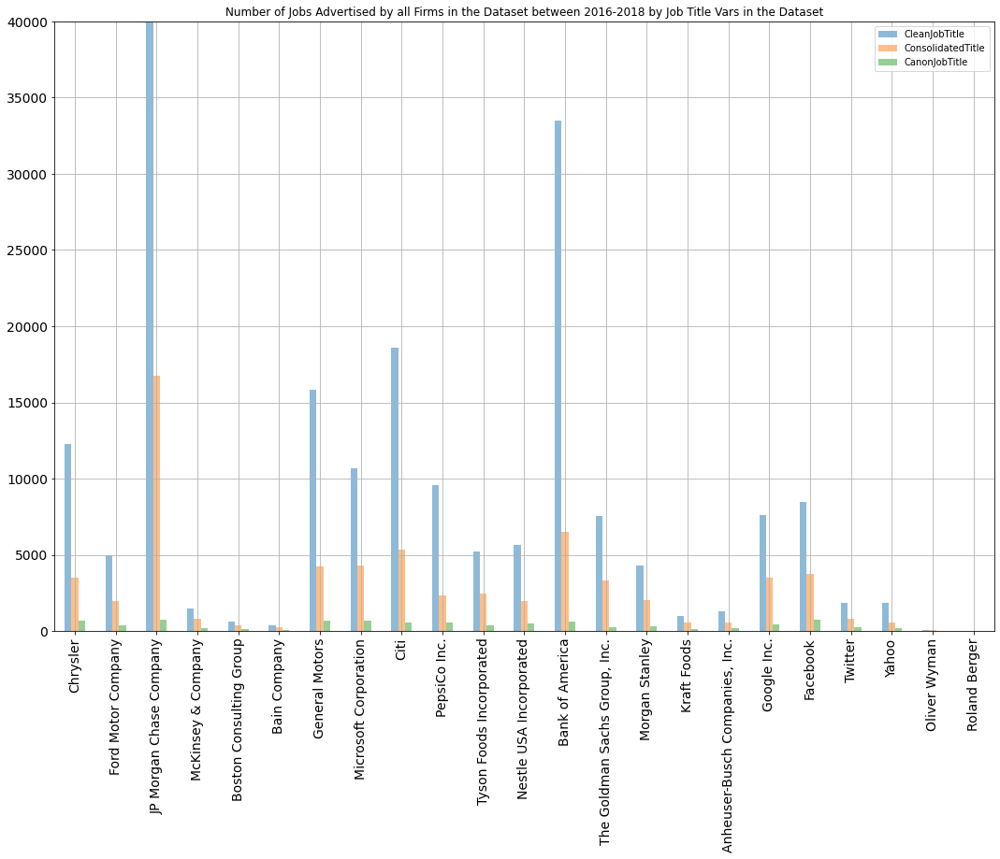

In [49]:
comps_title_nums.plot(kind='bar', legend=True,
                      ylim=(0, 40000),
                      rot=90, 
                      figsize=(18, 12),
                      fontsize=14,
                      title='Number of Jobs Advertised by all Firms in the Dataset between 2016-2018 by Job Title Vars in the Dataset',
                      grid=True,
                      alpha=0.50);

In [54]:
comps_titles[['Facebook_CleanJobTitle', 'Facebook_CanonJobTitle', 'Facebook_ConsolidatedTitle']].head()

,Facebook_CleanJobTitle,Facebook_CanonJobTitle,Facebook_ConsolidatedTitle
0,"Client Partner, Specialty Retail",NaN,"Client Partner, Specialty Retail"
1,"Head Of Customer Experience & Service, Building",Sales Consultant,"Head, Customer,Building"
2,"Marketing Science Partner, Retail",Sales Associate,"Marketing Science Partner, Retail"
3,Elcompanies,Retail Sales Associate,Elcompanies
4,"Head Of Industry, Retail Big Box",Retail Account Representative,"Head, Retail Industry"


In [51]:
occups = list(df['occu_text'].unique())
occups[:10]

['Retail Salespersons',
 'Cleaners of Vehicles and Equipment',
 'Automotive Service Technicians and Mechanics',
 'Sales Representatives, Wholesale and Manufacturing, Technical and Scientific Products',
 'Secretaries and Administrative Assistants, Except Legal, Medical, and Executive',
 'Parts Salespersons',
 'Operating Engineers and Other Construction Equipment Operators',
 'Light Truck or Delivery Services Drivers',
 'First-Line Supervisors of Mechanics, Installers, and Repairers',
 'Computer Programmers']

In [ ]:
%%time

unique_jobs_names = {}
unique_jobs_nums = {}

for comp in comps:
    occ_text = {}
    occ_nums = {}
    for occu in occups:
        job_vars_list = {}
        job_vars_nums = {}
        for var in job_cols:

            unique_jobs = list(df.loc[(df['CanonEmployer'] == comp) &
                                          (df['occu_text'] == occu), var].unique())
            number_jobs = len(df.loc[(df['CanonEmployer'] == comp) &
                                         (df['occu_text'] == occu), var].unique())
            job_vars_list[var] = unique_jobs
            job_vars_nums[var] = number_jobs
        occ_text[occu] = job_vars_list
        occ_nums[occu] = job_vars_nums
    unique_jobs_names[comp] = occ_text
    unique_jobs_nums[comp] = occ_nums

In [56]:
%%time

unique_jobs_names = {}
unique_jobs_nums = {}

# for comp in comps:
#     occ_text = {}
#     occ_nums = {}
for occu in occups:
    job_vars_list = {}
    job_vars_nums = {}
    for var in job_cols:
        
        unique_jobs = list(df.loc[(df['CanonEmployer'] == 'Facebook') &
                                      (df['occu_text'] == occu), var].unique())
        number_jobs = len(df.loc[(df['CanonEmployer'] == 'Facebook') &
                                     (df['occu_text'] == occu), var].unique())
        job_vars_list[var] = unique_jobs
        job_vars_nums[var] = number_jobs
#     occ_text[occu] = unique_jobs
#     occ_nums[occu] = number_jobs
    unique_jobs_names[occu] = job_vars_list
    unique_jobs_nums[occu] = job_vars_nums

CPU times: user 1min 38s, sys: 293 ms, total: 1min 38s
Wall time: 1min 38s


In [58]:
pprint(unique_jobs_nums)

{'Accountants and Auditors': {'CanonJobTitle': 27,
                              'CleanJobTitle': 131,
                              'ConsolidatedTitle': 55},
 'Actuaries': {'CanonJobTitle': 0, 'CleanJobTitle': 0, 'ConsolidatedTitle': 0},
 'Adult Basic and Secondary Education and Literacy Teachers and Instructors': {'CanonJobTitle': 0,
                                                                               'CleanJobTitle': 0,
                                                                               'ConsolidatedTitle': 0},
 'Advertising Sales Agents': {'CanonJobTitle': 2,
                              'CleanJobTitle': 3,
                              'ConsolidatedTitle': 3},
 'Aerospace Engineers': {'CanonJobTitle': 2,
                         'CleanJobTitle': 4,
                         'ConsolidatedTitle': 4},
 'Agricultural and Food Science Technicians': {'CanonJobTitle': 1,
                                               'CleanJobTitle': 1,
                              

In [65]:
pprint(unique_jobs_names)

{'Accountants and Auditors': {'CanonJobTitle': ['Account Manager',
                                                'Sales Account Manager',
                                                'Revenue Accountant',
                                                'Tax Associate',
                                                nan,
                                                'Accountant',
                                                'Internal Audit Manager',
                                                'Account Representative',
                                                'Audit Director',
                                                'Tax Manager',
                                                'Staff Accountant',
                                                'Project Accountant',
                                                'Internal Auditor',
                                                'Tax Analyst',
                                                'General Account

In [64]:
pd.DataFrame(unique_jobs_nums).T.reset_index().head()

,index,CleanJobTitle,ConsolidatedTitle,CanonJobTitle
0,Retail Salespersons,90,62,12
1,Cleaners of Vehicles and Equipment,0,0,0
2,Automotive Service Technicians and Mechanics,17,14,6
3,"Sales Representatives, Wholesale and Manufactu...",172,108,24
4,"Secretaries and Administrative Assistants, Exc...",171,21,13


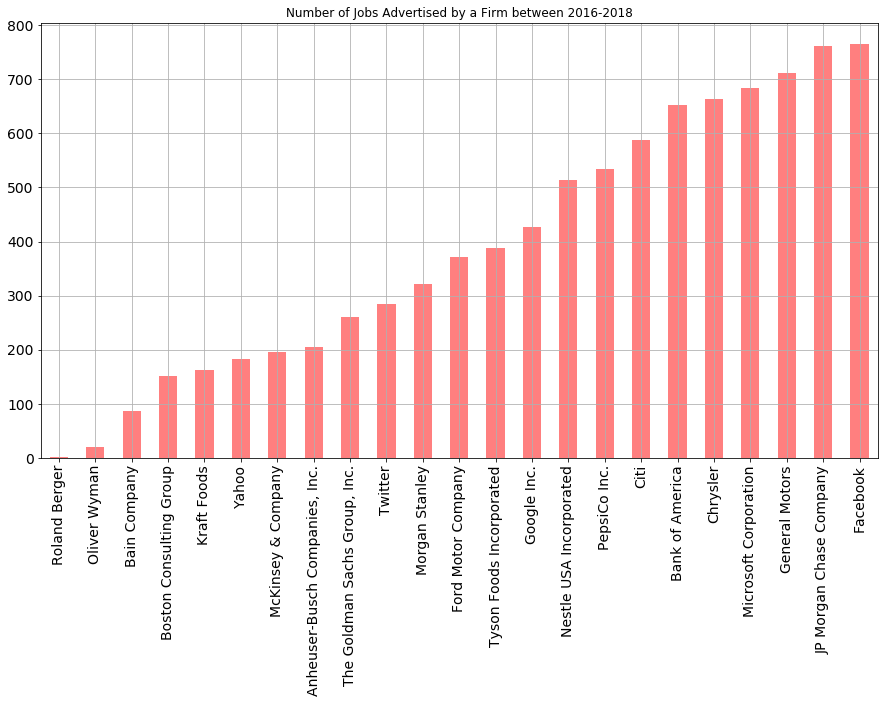

In [136]:
pd.Series(unique_jobs_nums).sort_values().plot(kind='bar',
                                              rot=90, 
                                              figsize=(15, 8),
                                              fontsize=14,
                                              color='red',
                                              title='Number of Jobs Advertised by all Firms in the Dataset between 2016-2018',
                                              grid=True,
                                              alpha=0.50);

In [74]:
%%time

# unique_jobs_names = {}
# unique_jobs_nums = {}

# for comp in comps:
ConsolidatedTitle_occ_text = {}
ConsolidatedTitle_occ_nums = {}
for occu in occups:
    unique_jobs = list(df.loc[(df['CanonEmployer'] == 'Facebook') &
                                  (df['occu_text'] == occu), 'ConsolidatedTitle'].unique())
    number_jobs = len(df.loc[(df['CanonEmployer'] == 'Facebook') &
                                 (df['occu_text'] == occu), 'ConsolidatedTitle'].unique())
ConsolidatedTitle_occ_text[occu] = unique_jobs
ConsolidatedTitle_occ_nums[occu] = number_jobs
# unique_jobs_names[comp] = occ_text
# unique_jobs_nums[comp] = occ_nums

CPU times: user 33.7 s, sys: 129 ms, total: 33.8 s
Wall time: 34.1 s


In [67]:
pprint(CanonJobTitle_occ_nums)

{'Accountants and Auditors': 27,
 'Actuaries': 0,
 'Adult Basic and Secondary Education and Literacy Teachers and Instructors': 0,
 'Advertising Sales Agents': 2,
 'Aerospace Engineers': 2,
 'Agricultural and Food Science Technicians': 1,
 'Aircraft Mechanics and Service Technicians': 1,
 'Amusement and Recreation Attendants': 2,
 'Animal Control Workers': 0,
 'Animal Trainers': 0,
 'Appraisers and Assessors of Real Estate': 0,
 'Architects, Except Landscape and Naval': 6,
 'Architectural and Civil Drafters': 0,
 'Archivists': 0,
 'Art Directors': 3,
 'Automotive Body and Related Repairers': 2,
 'Automotive Service Technicians and Mechanics': 6,
 'Automotive and Watercraft Service Attendants': 0,
 'Avionics Technicians': 1,
 'Baggage Porters and Bellhops': 2,
 'Bakers': 1,
 'Bill and Account Collectors': 3,
 'Billing and Posting Clerks': 3,
 'Biochemists and Biophysicists': 0,
 'Biological Technicians': 0,
 'Biomedical Engineers': 0,
 'Boilermakers': 0,
 'Bookkeeping, Accounting, and A

In [68]:
pprint(CanonJobTitle_occ_text)

{'Accountants and Auditors': ['Account Manager',
                              'Sales Account Manager',
                              'Revenue Accountant',
                              'Tax Associate',
                              nan,
                              'Accountant',
                              'Internal Audit Manager',
                              'Account Representative',
                              'Audit Director',
                              'Tax Manager',
                              'Staff Accountant',
                              'Project Accountant',
                              'Internal Auditor',
                              'Tax Analyst',
                              'General Accountant',
                              'Operations Specialist',
                              'Tax Director',
                              'Administrative Assistant',
                              'Cost Accountant',
                              'Data Analyst',
          

In [93]:
pprint(unique_jobs_nums['Facebook'])

{'Accountants and Auditors': 27,
 'Actuaries': 0,
 'Adult Basic and Secondary Education and Literacy Teachers and Instructors': 0,
 'Advertising Sales Agents': 2,
 'Aerospace Engineers': 2,
 'Agricultural and Food Science Technicians': 1,
 'Aircraft Mechanics and Service Technicians': 1,
 'Amusement and Recreation Attendants': 2,
 'Animal Control Workers': 0,
 'Animal Trainers': 0,
 'Appraisers and Assessors of Real Estate': 0,
 'Architects, Except Landscape and Naval': 6,
 'Architectural and Civil Drafters': 0,
 'Archivists': 0,
 'Art Directors': 3,
 'Automotive Body and Related Repairers': 2,
 'Automotive Service Technicians and Mechanics': 6,
 'Automotive and Watercraft Service Attendants': 0,
 'Avionics Technicians': 1,
 'Baggage Porters and Bellhops': 2,
 'Bakers': 1,
 'Bill and Account Collectors': 3,
 'Billing and Posting Clerks': 3,
 'Biochemists and Biophysicists': 0,
 'Biological Technicians': 0,
 'Biomedical Engineers': 0,
 'Boilermakers': 0,
 'Bookkeeping, Accounting, and A

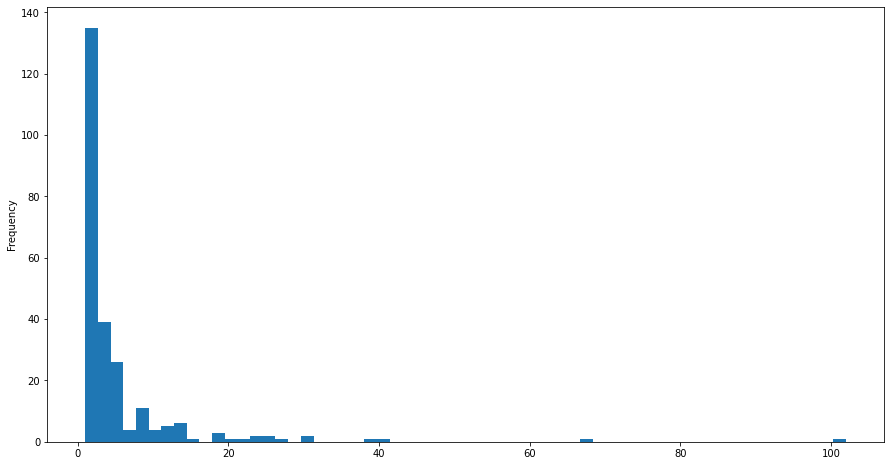

In [69]:
facebook = pd.Series(CanonJobTitle_occ_nums)
facebook_clean = facebook[facebook > 0]
facebook_clean.plot(kind='hist', bins=60, figsize=(15, 8))

In [70]:
facebook_clean.head()

Retail Salespersons                                                                      12
Automotive Service Technicians and Mechanics                                              6
Sales Representatives, Wholesale and Manufacturing, Technical and Scientific Products    24
Secretaries and Administrative Assistants, Except Legal, Medical, and Executive          13
Parts Salespersons                                                                        1
dtype: int64

In [71]:
facebook_clean.describe()

count    247.000000
mean       5.344130
std        9.686498
min        1.000000
25%        1.000000
50%        2.000000
75%        5.000000
max      102.000000
dtype: float64

In [72]:
fb_less_than_median = facebook_clean[facebook_clean < 2]

In [73]:
fb_less_than_median.head()

Parts Salespersons                                       1
Light Truck or Delivery Services Drivers                 1
Receptionists and Information Clerks                     1
Bus and Truck Mechanics and Diesel Engine Specialists    1
Tire Repairers and Changers                              1
dtype: int64

In [ ]:
fb_less_than_median.to_csv(path_assumptions + )

In [169]:
facebook_clean.columns = ['job', 'amount']

In [174]:
facebook_clean['pct_appearance'] = (facebook_clean['amount'] / 17448)
facebook_clean.describe()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,amount,pct_appearance
count,247.000000,247.000000
mean,5.344130,0.000306
std,9.686498,0.000555
min,1.000000,0.000057
25%,1.000000,0.000057
50%,2.000000,0.000115
75%,5.000000,0.000287
max,102.000000,0.005846


In [182]:
fb = pd.Series(unique_jobs_nums['Facebook'], name='nums')
fb_clean = fb[fb > 0]
fb_clean.head()

Retail Salespersons                                                                      12
Automotive Service Technicians and Mechanics                                              6
Sales Representatives, Wholesale and Manufacturing, Technical and Scientific Products    24
Secretaries and Administrative Assistants, Except Legal, Medical, and Executive          13
Parts Salespersons                                                                        1
Name: nums, dtype: int64

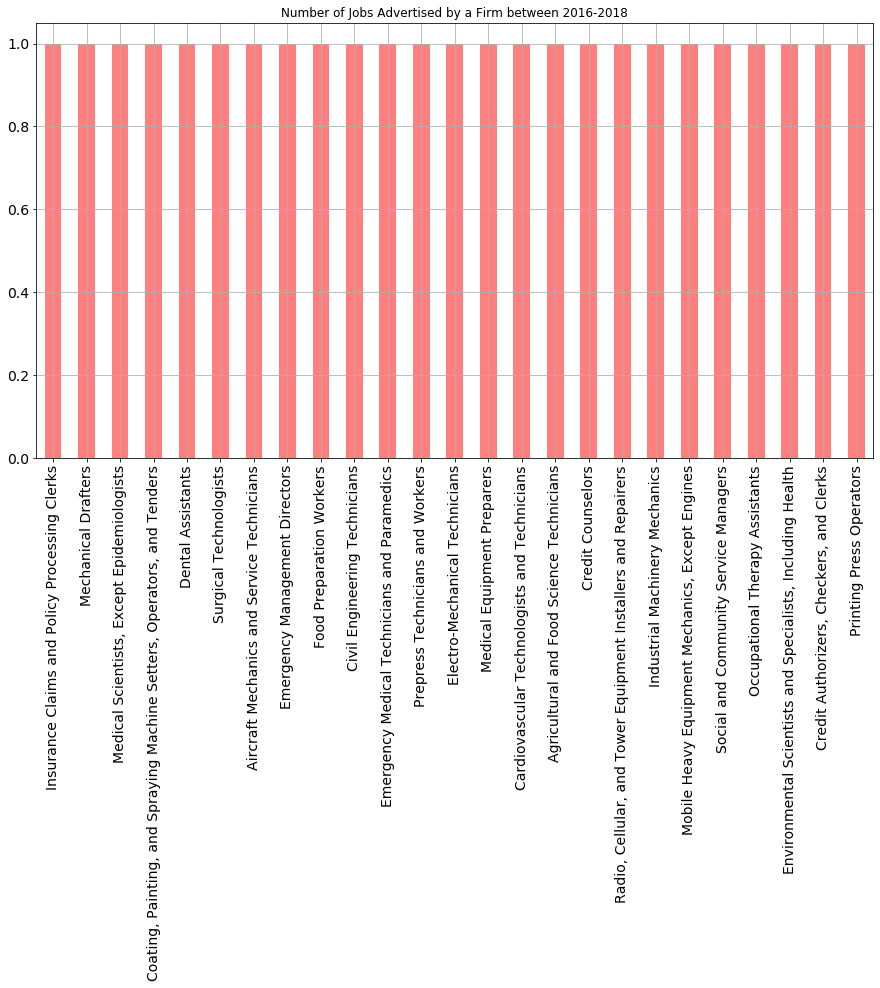

In [184]:
pd.Series(fb_clean).sort_values()[:25].plot(kind='bar',
                                              rot=90, 
                                              figsize=(15, 8),
                                              fontsize=14,
                                              color='red',
                                              title='Number of Jobs Advertised by a Firm between 2016-2018',
                                              grid=True,
                                              alpha=0.50);

# c. For every job title, number of occupations it appears under

In [7]:
job_cols

NameError: name 'job_cols' is not defined

In [5]:
CleanJobTitle = [x for x in list(df['CleanJobTitle'].unique()) if str(x) != 'nan']
ConsolidatedTitle = [x for x in list(df['ConsolidatedTitle'].unique()) if str(x) != 'nan']
CanonJobTitle = [x for x in list(df['CanonJobTitle'].unique()) if str(x) != 'nan']
CleanJobTitle[:2], ConsolidatedTitle[:2], CanonJobTitle[:2]

(['Sales Associate', 'Automotive Sales Associate'],
 ['Sales Associate', 'Automobile Sales'],
 ['Sales Associate', 'Sales Representative'])

In [6]:
len(CleanJobTitle), len(ConsolidatedTitle), len(CanonJobTitle)

(207310, 54487, 2278)

In [106]:
%%time

unique_jobs_occu_titles = {}
unique_jobs_occu_nums = {}

# for job in jobs:
def get_jobs(job):
    unique_jobs = list(df.loc[(df['CanonJobTitle'] == job) &
                              (df['CanonEmployer'] == 'Facebook'), 'occu_text'].unique())
    number_jobs = len(df.loc[(df['CanonJobTitle'] == job) &
                              (df['CanonEmployer'] == 'Facebook'), 'occu_text'].unique())
    unique_jobs_occu_titles[job] = unique_jobs
    unique_jobs_occu_nums[job] = number_jobs
    return unique_jobs_occu_titles, unique_jobs_occu_nums

CPU times: user 6 µs, sys: 3 µs, total: 9 µs
Wall time: 11 µs


In [107]:
%%time

unique_jobs_occu_titles = {}
unique_jobs_occu_nums = {}

with concurrent.futures.ProcessPoolExecutor() as executor:
    executor.map(get_jobs, CanonJobTitle)

CPU times: user 136 ms, sys: 101 ms, total: 237 ms
Wall time: 240 ms


In [108]:
pprint(unique_jobs_occu_nums)

{}


In [88]:
from collections import Counter

In [109]:
%%time

occurances_CleanJobTitle = Counter(df.loc[df['CanonEmployer'] == 'Facebook', 'CleanJobTitle'])
occurances_ConsolidatedTitle = Counter(df.loc[df['CanonEmployer'] == 'Facebook', 'ConsolidatedTitle'])
occurances_CanonJobTitle = Counter(df.loc[df['CanonEmployer'] == 'Facebook', 'CanonJobTitle'])

CPU times: user 84 ms, sys: 13.3 ms, total: 97.3 ms
Wall time: 108 ms


In [90]:
type(occurances)

collections.Counter

In [114]:
occu_clean = pd.DataFrame.from_dict(occurances_CleanJobTitle, orient='index', columns=['appearances']).reset_index().dropna()
occu_consolidated = pd.DataFrame.from_dict(occurances_ConsolidatedTitle, orient='index', columns=['appearances']).reset_index().dropna()
occu_canon = pd.DataFrame.from_dict(occurances_CanonJobTitle, orient='index', columns=['appearances']).reset_index().dropna()

In [115]:
occu_clean.head()

,index,appearances
0,"Client Partner, Specialty Retail",2
1,"Head Of Customer Experience & Service, Building",1
2,"Marketing Science Partner, Retail",2
3,Elcompanies,1
4,"Head Of Industry, Retail Big Box",2


In [118]:
occu_clean.describe()

,appearances
count,8499.000000
mean,2.053771
std,2.749835
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,56.000000


In [119]:
occu_consolidated.head()

,index,appearances
0,"Client Partner, Specialty Retail",2
1,"Head, Customer,Building",2
2,"Marketing Science Partner, Retail",2
3,Elcompanies,1
4,"Head, Retail Industry",3


In [120]:
occu_consolidated.describe()

,appearances
count,3760.000000
mean,4.642287
std,24.931350
min,1.000000
25%,1.000000
50%,1.000000
75%,3.000000
max,1265.000000


In [117]:
occu_canon.head()

,index,appearances
1,Sales Consultant,15
2,Sales Associate,53
3,Retail Sales Associate,10
4,Retail Account Representative,1
5,Shop Associate,85


In [121]:
occu_canon.describe()

,appearances
count,765.000000
mean,11.901961
std,53.040457
min,1.000000
25%,1.000000
50%,2.000000
75%,7.000000
max,1265.000000


In [125]:
%%time

writer = pd.ExcelWriter(path_assumptions + 'fb_job_var_nums.xlsx', engine='xlsxwriter')

# Write each dataframe to a different worksheet.
occu_clean.to_excel(writer, sheet_name='CleanJobTitle', index=False)
occu_consolidated.to_excel(writer, sheet_name='ConsolidatedTitle', index=False)
occu_canon.to_excel(writer, sheet_name='CanonJobTitle', index=False)

# Close the Pandas Excel writer and output the Excel file.
writer.save()

CPU times: user 517 ms, sys: 214 ms, total: 730 ms
Wall time: 1.01 s


In [138]:
pprint(unique_jobs_occu_nums)

{'.Net Application Developer': 3,
 '.Net Architect': 3,
 '.Net Developer': 8,
 '.Net Programmer': 4,
 '.Net Team Lead': 1,
 '.Net Technical Lead': 1,
 '.Net Web Developer': 1,
 '3D Generalist': 1,
 'A Technician': 1,
 'A or B Level Technician': 1,
 'ASE Technician': 1,
 'ASP .Net Developer': 3,
 'Academic Coordinator': 1,
 'Accessibility Specialist': 2,
 'Accessories Sales Associate': 2,
 'Accommodation Specialist': 1,
 'Account Director': 5,
 'Account Executive': 1,
 'Account Manager': 18,
 'Account Representative': 3,
 'Account Sales Representative': 1,
 'Accountant': 4,
 'Accounting Analyst': 10,
 'Accounting Assistant': 3,
 'Accounting Clerk': 4,
 'Accounting Coordinator': 2,
 'Accounting Manager': 5,
 'Accounting Specialist': 5,
 'Accounting Supervisor': 1,
 'Accounting Technician': 6,
 'Accounting and Finance Recruiter / Recruitment Manager': 1,
 'Accounts Payable Analyst': 3,
 'Accounts Payable Associate': 1,
 'Accounts Payable Clerk': 1,
 'Accounts Payable Coordinator': 1,
 'Ac

In [189]:
pprint(unique_jobs_occu_nums)

{'.Net Application Developer': 1,
 '.Net Architect': 0,
 '.Net Developer': 1,
 '.Net Programmer': 1,
 '.Net Team Lead': 0,
 '.Net Technical Lead': 0,
 '.Net Web Developer': 1,
 '3D Generalist': 1,
 'A Technician': 1,
 'A or B Level Technician': 0,
 'ASE Technician': 0,
 'ASP .Net Developer': 0,
 'Academic Coordinator': 0,
 'Accessibility Specialist': 2,
 'Accessories Sales Associate': 0,
 'Accommodation Specialist': 1,
 'Account Director': 1,
 'Account Executive': 1,
 'Account Manager': 1,
 'Account Representative': 1,
 'Account Sales Representative': 1,
 'Accountant': 1,
 'Accounting Analyst': 1,
 'Accounting Assistant': 1,
 'Accounting Clerk': 1,
 'Accounting Coordinator': 1,
 'Accounting Manager': 0,
 'Accounting Specialist': 1,
 'Accounting Supervisor': 1,
 'Accounting Technician': 1,
 'Accounting and Finance Recruiter / Recruitment Manager': 0,
 'Accounts Payable Analyst': 1,
 'Accounts Payable Associate': 1,
 'Accounts Payable Clerk': 1,
 'Accounts Payable Coordinator': 1,
 'Acco

In [185]:
pd.Series(unique_jobs_occu_nums).describe()

count    2278.000000
mean        2.543898
std         3.861634
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        44.000000
dtype: float64

In [188]:
pd.Series(unique_jobs_occu_nums).describe()

count    2278.000000
mean        0.717296
std         0.523467
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         4.000000
dtype: float64

In [186]:
new_df.columns

Index(['BGTOcc', 'BGTSubOcc', 'CanonCity', 'CanonCounty', 'CanonEmployer',
       'CanonJobHours', 'CanonJobTitle', 'CanonJobType', 'CanonMinimumDegree',
       'CanonPostalCode', 'CanonRequiredDegrees', 'CanonSkillClusters',
       'CanonSkills', 'CanonState', 'CanonYearsOfExperienceCanonLevel',
       'CanonYearsOfExperienceLevel', 'CleanJobTitle',
       'ConsolidatedDegreeLevels', 'ConsolidatedInferredNAICS',
       'ConsolidatedONET', 'ConsolidatedTitle', 'DivisionCode',
       'InternshipFlag', 'IsDuplicate', 'JobDate', 'JobID', 'JobText', 'LMA',
       'Language', 'Latitude', 'Longitude', 'MSA', 'MinDegreeLevel',
       'MinExperience', 'Source', 'YearsOfExperience', 'occu_code',
       'occu_text'],
      dtype='object')

# d. Avg number of occupations a job title is assigned to

In [ ]:
avg

%%time

unique_jobs_occu_titles = {}
unique_jobs_occu_nums = {}


len(CleanJobTitle), len(ConsolidatedTitle), len(CanonJobTitle)

# for job in jobs:
def get_jobs(jobs):
#     unique_jobs = list(df.loc[(df['CanonJobTitle'] == job) &
#                               (df['CanonEmployer'] == 'Facebook'), 'occu_text'].unique())
    unique_jobs_occu_nums = {}
    for job in jobs:
        number_jobs = len(df.loc[df['CanonJobTitle'] == job, 'occu_text'])
#         unique_jobs_occu_titles[job] = unique_jobs
        unique_jobs_occu_nums[job] = number_jobs
    return unique_jobs_occu_nums

In [129]:
all_jobs = [CleanJobTitle, ConsolidatedTitle, CanonJobTitle]

In [146]:
all_job_cols = ['CleanJobTitle', 'ConsolidatedTitle', 'CanonJobTitle']
all_job_cols

['CleanJobTitle', 'ConsolidatedTitle', 'CanonJobTitle']

In [153]:
all_jobs[0][0]

'Sales Associate'

In [154]:
df.loc[df[all_job_cols[0]] == 'Developer Relations Engineer', 'occu_text'].head()

73522    Computer Programmers
74638    Computer Programmers
90576    Computer Programmers
90581    Computer Programmers
91366    Computer Programmers
Name: occu_text, dtype: object

In [130]:
somelist = [1, 2, 3, 4, 5, 1, 1, 2, 2, 2, 2, 2, 4, 3, 3, 3]

testing = Counter(somelist)

In [139]:
list(testing.values())

3.2

In [ ]:
%%time

CanonJobTitle_all_jobs = {}

# for col in all_jobs:
#     the_jobs = {}
for job in CanonJobTitle:
    counter_of_jobs = Counter(df.loc[df['CanonJobTitle'] == job, 'occu_text'])
    mean_of_occup = np.mean(list(counter_of_jobs.values()))
#     the_jobs[job] = mean_of_occup
    CanonJobTitle_all_jobs[job] = mean_of_occup

In [9]:
group_CanonJobTitle = df.groupby('CanonJobTitle')
group_CanonJobTitle['occu_text'].agg('count').head()

CanonJobTitle
.Net Application Developer     56
.Net Architect                 15
.Net Developer                463
.Net Programmer                37
.Net Team Lead                  4
Name: occu_text, dtype: int64

## CanonJobTitle

In [100]:
group_CanonJobTitle = df.groupby(['CanonJobTitle', 'occu_text'])
testing = group_CanonJobTitle['occu_text'].agg('count')
df_CanonJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
df_CanonJobTitle.head()

,CanonJobTitle,occu_text,occu_count
0,.Net Application Developer,Computer Programmers,53
1,.Net Application Developer,Computer User Support Specialists,1
2,.Net Application Developer,Web Developers,2
3,.Net Architect,"Computer Occupations, All Other",1
4,.Net Architect,Computer Programmers,4


In [101]:
first_gb = df_CanonJobTitle.groupby('CanonJobTitle')
first_gb = first_gb['occu_count'].agg('mean')#.rename('occu_mean')
first_gb.head()

CanonJobTitle
.Net Application Developer    18.666667
.Net Architect                 5.000000
.Net Developer                57.875000
.Net Programmer                9.250000
.Net Team Lead                 4.000000
Name: occu_count, dtype: float64

## CleanJobTitle

In [102]:
group_CleanJobTitle = df.groupby(['CleanJobTitle', 'occu_text'])
testing = group_CleanJobTitle['occu_text'].agg('count')
df_CleanJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
df_CleanJobTitle.head()

,CleanJobTitle,occu_text,occu_count
0,$22.77 Per Hour Job,Cost Estimators,1
1,& - Fc Client Service Representative I,Customer Service Representatives,1
2,& - Fc Client Service Representative I Teller,Customer Service Representatives,1
3,& - Relationship Banker- Financial Cen,New Accounts Clerks,1
4,& - Relationship Banker- Financial Center,New Accounts Clerks,1


In [103]:
second_gb = df_CleanJobTitle.groupby('CleanJobTitle')
second_gb = second_gb['occu_count'].agg('mean').rename('occu_mean')
second_gb.head(50)

CleanJobTitle
$22.77 Per Hour Job                                                         1.0
& - Fc Client Service Representative I                                      1.0
& - Fc Client Service Representative I Teller                               1.0
& - Relationship Banker- Financial Cen                                      1.0
& - Relationship Banker- Financial Center                                   1.0
& Bch-Relationship Banker- , Flarea - Spanish                               1.0
& Bch-Relationship Banker- Center                                           1.0
& Bch-Relationship Banker- Center, -Spanish                                 1.0
& Bch-Relationship Banker-Devonaire Center                                  1.0
& Bch-Relationship Banker-Devonaire Center, , -Spanish                      1.0
& Brand Advertising Specialist                                              1.0
& Kettner - Fc Client Service Representative I                              1.0
& Kettner - Fc Client Serv

## ConsolidatedTitle

In [104]:
group_ConsolidatedTitle = df.groupby(['ConsolidatedTitle', 'occu_text'])
testing = group_ConsolidatedTitle['occu_text'].agg('count')
df_ConsolidatedTitle = testing.reset_index(level=1, name='occu_count').reset_index()
df_ConsolidatedTitle.head()

,ConsolidatedTitle,occu_text,occu_count
0,$22.77 Per Hour Job,Cost Estimators,1
1,'s,"Combined Food Preparation and Serving Workers,...",1
2,'s Center For Family Wealth Dynamics And Gover...,First-Line Supervisors of Retail Sales Workers,1
3,"'s Seasonal Retail Receiving, Garden State Plaza",Sales Managers,1
4,'s Street Team,Demonstrators and Product Promoters,1


In [105]:
third_gb = df_ConsolidatedTitle.groupby('ConsolidatedTitle')
third_gb = third_gb['occu_count'].agg('mean').rename('occu_mean')
third_gb.head(50)

ConsolidatedTitle
$22.77 Per Hour Job                                           1.000000
's                                                            1.000000
's Center For Family Wealth Dynamics And Governance           1.000000
's Seasonal Retail Receiving, Garden State Plaza              1.000000
's Street Team                                                1.000000
.Net Application Developer                                   18.666667
.Net Applicationdeveloper                                     1.000000
.Net Applicationsdeveloper                                    2.000000
.Net Architect                                                5.000000
.Net C# Software Engineering Lead                             3.000000
.Net Developer                                               57.750000
.Net Development Lead                                         1.000000
.Net Production Services Lead                                 1.000000
.Net Production Support Lead                               

In [75]:
%%time

writer = pd.ExcelWriter(path_assumptions + 'average_occu_jobs.xlsx', engine='xlsxwriter')

# Write each dataframe to a different worksheet.
df_CanonJobTitle.to_excel(writer, sheet_name='CanonJobTitle', index=False)
first_gb.to_excel(writer, sheet_name='Avg_CanonJobTitle')

df_CleanJobTitle.to_excel(writer, sheet_name='CleanJobTitle', index=False)
second_gb.to_excel(writer, sheet_name='Avg_CleanJobTitle')

df_ConsolidatedTitle.to_excel(writer, sheet_name='ConsolidatedTitle', index=False)
third_gb.to_excel(writer, sheet_name='Avg_ConsolidatedTitle')


# Close the Pandas Excel writer and output the Excel file.
writer.save()

CPU times: user 24.4 s, sys: 908 ms, total: 25.4 s
Wall time: 25.6 s


In [23]:
group_CanonJobTitle.groups

{('Sales Associate',
  'Retail Salespersons'): Int64Index([   0,    1,    2,    3,    7,    8,   10,   11,   37,   43,
             ...
             5956, 5958, 5959, 5960, 5961, 5962, 5964, 5966, 5968, 5969],
            dtype='int64', length=1644),
 (nan,
  'Retail Salespersons'): Int64Index([   4,    5,    6,    9,   13,   14,   15,   16,   17,   20,
             ...
             5932, 5933, 5934, 5936, 5937, 5938, 5939, 5941, 5957, 5967],
            dtype='int64', length=2465),
 ('Sales Representative',
  'Retail Salespersons'): Int64Index([  12,   26,   27,   38,   39,   41,   44,   45,   46,   47,  144,
              380,  444,  532,  533,  602,  649,  657,  688,  699,  717,  761,
              768,  771,  783,  824,  828,  838,  855,  914,  937,  954,  982,
              983, 1117, 1128, 1152, 1171, 1193, 1194, 1538, 2197, 2343, 2351,
             2775, 2807],
            dtype='int64'),
 ('Salesperson',
  'Retail Salespersons'): Int64Index([  18,   19,   68,   94,  111,  112, 

In [28]:
for idx, group in group_CanonJobTitle['occu_text']:
    print(idx[0])
    print(group.count())

.Net Application Developer
53
.Net Application Developer
1
.Net Application Developer
2
.Net Architect
1
.Net Architect
4
.Net Architect
10
.Net Developer
5
.Net Developer
438
.Net Developer
2
.Net Developer
3
.Net Developer
2
.Net Developer
1
.Net Developer
1
.Net Developer
11
.Net Programmer
34
.Net Programmer
1
.Net Programmer
1
.Net Programmer
1
.Net Team Lead
4
.Net Technical Lead
1
.Net Web Developer
17
3D Generalist
7
A Technician
2
A or B Level Technician
1
ASE Technician
7
ASP .Net Developer
2
ASP .Net Developer
1
ASP .Net Developer
25
Academic Coordinator
1
Accessibility Specialist
1
Accessibility Specialist
4
Accessories Sales Associate
1
Accessories Sales Associate
1
Accommodation Specialist
1
Account Director
9
Account Director
2
Account Director
1
Account Director
14
Account Director
109
Account Executive
372
Account Manager
2197
Account Manager
57
Account Manager
4
Account Manager
1
Account Manager
4
Account Manager
41
Account Manager
3
Account Manager
3
Account Manager


In [149]:
from typing import Tuple

In [155]:
def get_jobs_mean(job: np.str) -> Tuple[np.str, np.float32]:
    counter_of_jobs = Counter(df.loc[df['CleanJobTitle'] == job, 'occu_text'])
    mean_of_occup = np.mean(list(counter_of_jobs.values()))
    return (job, round(mean_of_occup), 3)

In [ ]:
%%time

with concurrent.futures.ThreadPoolExecutor() as executor:
    clean_titles_mean = executor.map(get_jobs_mean, CleanJobTitle)

In [ ]:
%%time

clean_titles_mean = list(clean_titles_mean)

In [141]:
df.head()

,BGTOcc,BGTSubOcc,CanonEmployer,CanonJobHours,CanonJobTitle,CanonJobType,CanonSkillClusters,CanonSkills,CanonYearsOfExperienceLevel,CleanJobTitle,ConsolidatedInferredNAICS,ConsolidatedONET,ConsolidatedTitle,DivisionCode,JobDate,JobID,JobText,LMA,Latitude,Longitude,MSA,MinExperience,occu_code,occu_text
0,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Sp...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-25,38201188919,"Sales Associates\n-Foley,AL36535\n-3781 S McKe...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN,412031,Retail Salespersons
1,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,NaN,Automotive Sales Associate,336111.0,41203100,Sales Associate,NaN,2017-03-24,38200222343,"AUTO SALES ASSOCIATES, ENTRY LEVEL\n\nGULF CHR...",MC011930,30.3962,-87.7019,19300: Metropolitan Statistical Area,NaN,412031,Retail Salespersons
2,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,mid,Automotive Sales Associate,336111.0,41203100,Sales Associate,16974.0,2017-03-13,38195316884,Automotive Sales Associate\n\nArlington Height...,DV171697|MT171698,41.8792,-87.9747,16980: Metropolitan Statistical Area|176: Comb...,3.0,412031,Retail Salespersons
3,412031,Retail Sales Associate (General),Chrysler,fulltime,Sales Associate,permanent,Sales: Specialized Sales;Specialized Skills|Co...,{'Automotive Sales': 'Sales: Specialized Sales...,mid,Automotive Sales Associate,336111.0,41203100,Sales Associate,20994.0,2017-03-13,38195337619,"Automotive Sales Associate\n\nElgin, Illinois ...",DV171697|MT171698,42.0363,-88.2398,16980: Metropolitan Statistical Area|176: Comb...,3.0,412031,Retail Salespersons
4,412031,Retail Sales Associate (General),Chrysler,fulltime,NaN,permanent,Supply Chain and Logistics: Procurement;Specia...,{'Buying Experience': 'Supply Chain and Logist...,NaN,Automobile Sales & Used,336111.0,41203100,Automobile Sales,NaN,2017-03-14,38195661888,Automobile Sales NEW & USED\n\nJake Sweeney Ch...,MT391714,39.1072,-84.5003,17140: Metropolitan Statistical Area,NaN,412031,Retail Salespersons


In [58]:
sorted(df.loc[df['ConsolidatedTitle'].notna(), 'ConsolidatedTitle'].values)[:1500]

['$22.77 Per Hour Job',
 "'s",
 "'s Center For Family Wealth Dynamics And Governance",
 "'s Seasonal Retail Receiving, Garden State Plaza",
 "'s Street Team",
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.Net Application Developer',
 '.N

## Facebook CanonJobTitle

In [120]:
group_CanonJobTitle = df[df['CanonEmployer'] == 'Facebook'].groupby(['CanonJobTitle', 'occu_text'])
testing = group_CanonJobTitle['occu_text'].agg('count')
df_CanonJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
first_gb = df_CanonJobTitle.groupby('CanonJobTitle')
first_gb = first_gb['occu_count'].agg('mean').rename('occu_mean')
first_gb.head()

CanonJobTitle
.Net Developer        4.0
.Net Web Developer    1.0
3D Generalist         4.0
ASP .Net Developer    1.0
Account Director      4.0
Name: occu_mean, dtype: float64

## CleanJobTitle

In [115]:
group_CleanJobTitle = df[df['CanonEmployer'] == 'Facebook'].groupby(['CleanJobTitle', 'occu_text'])
testing = group_CleanJobTitle['occu_text'].agg('count')
df_CleanJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
second_gb = df_CleanJobTitle.groupby('CleanJobTitle')
second_gb = second_gb['occu_count'].agg('mean').rename('occu_mean')
second_gb.head()

,CleanJobTitle,occu_text,occu_count
0,.Net Consultant,Computer Systems Analysts,1
1,.Net Developer,Computer Programmers,4
2,.Net Web Developer,Web Developers,1
3,0005 Behavioral Health Registered Nurse,Registered Nurses,1
4,10-$15/Hour Summer Job 40 Hr/Week House Painti...,"Vocational Education Teachers, Postsecondary",1


## ConsolidatedTitle

In [121]:
group_ConsolidatedTitle = df[df['CanonEmployer'] == 'Facebook'].groupby(['ConsolidatedTitle', 'occu_text'])
testing = group_ConsolidatedTitle['occu_text'].agg('count')
df_ConsolidatedTitle = testing.reset_index(level=1, name='occu_count').reset_index()
third_gb = df_ConsolidatedTitle.groupby('ConsolidatedTitle')
third_gb = third_gb['occu_count'].agg('mean').rename('occu_mean')
third_gb.head()

ConsolidatedTitle
.Net Developer                                         4.0
.Net Web Developer                                     1.0
10-$15/Hour Summer Job 40 Hr/Week House Painting Co    1.0
1469770459                                             1.0
1776076392                                             1.0
Name: occu_mean, dtype: float64

In [119]:
%%time

writer = pd.ExcelWriter(path_assumptions + 'fb_average_occu_jobs.xlsx', engine='xlsxwriter')

# Write each dataframe to a different worksheet.
df_CanonJobTitle.to_excel(writer, sheet_name='FB_CanonJobTitle', index=False)
first_gb.to_excel(writer, sheet_name='FB_Avg_CanonJobTitle')

df_CleanJobTitle.to_excel(writer, sheet_name='FB_CleanJobTitle', index=False)
second_gb.to_excel(writer, sheet_name='FB_Avg_CleanJobTitle')

df_ConsolidatedTitle.to_excel(writer, sheet_name='FB_ConsolidatedTitle', index=False)
third_gb.to_excel(writer, sheet_name='FB_Avg_ConsolidatedTitle')


# Close the Pandas Excel writer and output the Excel file.
writer.save()

CPU times: user 1.25 s, sys: 317 ms, total: 1.57 s
Wall time: 1.59 s


## McKinsey CanonJobTitle

In [122]:
df['CanonEmployer'].unique()

array(['Chrysler', 'Ford Motor Company', 'JP Morgan Chase Company',
       'McKinsey & Company', 'Boston Consulting Group', 'Bain Company',
       'General Motors', 'Microsoft Corporation', 'Citi', 'PepsiCo Inc.',
       'Tyson Foods Incorporated', 'Nestle USA Incorporated',
       'Bank of America', 'The Goldman Sachs Group, Inc.',
       'Morgan Stanley', 'Kraft Foods', 'Anheuser-Busch Companies, Inc.',
       'Google Inc.', 'Facebook', 'Twitter', 'Yahoo', 'Oliver Wyman',
       'Roland Berger'], dtype=object)

In [134]:
group_CanonJobTitle = df[df['CanonEmployer'] == 'McKinsey & Company'].groupby(['CanonJobTitle', 'occu_text'])
testing = group_CanonJobTitle['occu_text'].agg('count')
df_CanonJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
first_gb = df_CanonJobTitle.groupby('CanonJobTitle')
first_gb = first_gb['occu_count'].agg('mean').rename('occu_mean')
first_gb.head()

CanonJobTitle
Account Director              4.0
Account Manager              18.0
Accountant                    8.5
Accounts Receivable Clerk     1.0
Actuarial Consultant         25.0
Name: occu_mean, dtype: float64

## CleanJobTitle

In [135]:
group_CleanJobTitle = df[df['CanonEmployer'] == 'McKinsey & Company'].groupby(['CleanJobTitle', 'occu_text'])
testing = group_CleanJobTitle['occu_text'].agg('count')
df_CleanJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
second_gb = df_CleanJobTitle.groupby('CleanJobTitle')
second_gb = second_gb['occu_count'].agg('mean').rename('occu_mean')
second_gb.head()

CleanJobTitle
Account Manager                              2.0
Account Manager, Cpg                         1.0
Account Satisfaction Director                4.0
Account Strategist                           2.0
Account Strategist Leading Digital Agency    1.0
Name: occu_mean, dtype: float64

## ConsolidatedTitle

In [136]:
group_ConsolidatedTitle = df[df['CanonEmployer'] == 'McKinsey & Company'].groupby(['ConsolidatedTitle', 'occu_text'])
testing = group_ConsolidatedTitle['occu_text'].agg('count')
df_ConsolidatedTitle = testing.reset_index(level=1, name='occu_count').reset_index()
third_gb = df_ConsolidatedTitle.groupby('ConsolidatedTitle')
third_gb = third_gb['occu_count'].agg('mean').rename('occu_mean')
third_gb.head()

ConsolidatedTitle
Account Director                4.0
Account Manager                18.0
Account Strategist              2.0
Account Strategist, Digital     1.0
Accountant                      8.5
Name: occu_mean, dtype: float64

In [137]:
%%time

writer = pd.ExcelWriter(path_assumptions + 'mckinsey_average_occu_jobs.xlsx', engine='xlsxwriter')

# Write each dataframe to a different worksheet.
df_CanonJobTitle.to_excel(writer, sheet_name='MK_CanonJob', index=False)
first_gb.to_excel(writer, sheet_name='MK_Avg_CanonJob')

df_CleanJobTitle.to_excel(writer, sheet_name='MK_CleanJob', index=False)
second_gb.to_excel(writer, sheet_name='MK_Avg_CleanJob')

df_ConsolidatedTitle.to_excel(writer, sheet_name='MK_Consolid', index=False)
third_gb.to_excel(writer, sheet_name='MK_Avg_Consolid')


# Close the Pandas Excel writer and output the Excel file.
writer.save()

CPU times: user 247 ms, sys: 13.7 ms, total: 260 ms
Wall time: 261 ms


## Microsoft CanonJobTitle

In [138]:
df['CanonEmployer'].unique()

array(['Chrysler', 'Ford Motor Company', 'JP Morgan Chase Company',
       'McKinsey & Company', 'Boston Consulting Group', 'Bain Company',
       'General Motors', 'Microsoft Corporation', 'Citi', 'PepsiCo Inc.',
       'Tyson Foods Incorporated', 'Nestle USA Incorporated',
       'Bank of America', 'The Goldman Sachs Group, Inc.',
       'Morgan Stanley', 'Kraft Foods', 'Anheuser-Busch Companies, Inc.',
       'Google Inc.', 'Facebook', 'Twitter', 'Yahoo', 'Oliver Wyman',
       'Roland Berger'], dtype=object)

In [139]:
group_CanonJobTitle = df[df['CanonEmployer'] == 'Microsoft Corporation'].groupby(['CanonJobTitle', 'occu_text'])
testing = group_CanonJobTitle['occu_text'].agg('count')
df_CanonJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
first_gb = df_CanonJobTitle.groupby('CanonJobTitle')
first_gb = first_gb['occu_count'].agg('mean').rename('occu_mean')
first_gb.head()

CanonJobTitle
.Net Developer         7.666667
3D Generalist          3.000000
Account Director       3.333333
Account Executive    330.000000
Account Manager      140.750000
Name: occu_mean, dtype: float64

## CleanJobTitle

In [140]:
group_CleanJobTitle = df[df['CanonEmployer'] == 'Microsoft Corporation'].groupby(['CleanJobTitle', 'occu_text'])
testing = group_CleanJobTitle['occu_text'].agg('count')
df_CleanJobTitle = testing.reset_index(level=1, name='occu_count').reset_index()
second_gb = df_CleanJobTitle.groupby('CleanJobTitle')
second_gb = second_gb['occu_count'].agg('mean').rename('occu_mean')
second_gb.head()

CleanJobTitle
.Net Associate Consultant -Federal Space    1.0
.Net Consultant                             1.0
.Net Consultant - Federal Space             1.0
.Net Developer                              8.0
.Net Developer - Azure                      1.0
Name: occu_mean, dtype: float64

## ConsolidatedTitle

In [141]:
group_ConsolidatedTitle = df[df['CanonEmployer'] == 'Microsoft Corporation'].groupby(['ConsolidatedTitle', 'occu_text'])
testing = group_ConsolidatedTitle['occu_text'].agg('count')
df_ConsolidatedTitle = testing.reset_index(level=1, name='occu_count').reset_index()
third_gb = df_ConsolidatedTitle.groupby('ConsolidatedTitle')
third_gb = third_gb['occu_count'].agg('mean').rename('occu_mean')
third_gb.head()

ConsolidatedTitle
.Net Developer                                     7.666667
1St Party Manger, World-Wide Enterprise Devices    4.000000
2019 Microsoft Ai Residency Program                3.000000
365Dynamics Crm Business Analysis                  1.000000
3D Generalist                                      3.000000
Name: occu_mean, dtype: float64

In [142]:
%%time

writer = pd.ExcelWriter(path_assumptions + 'msft_average_occu_jobs.xlsx', engine='xlsxwriter')

# Write each dataframe to a different worksheet.
df_CanonJobTitle.to_excel(writer, sheet_name='MSFT_CanonJob', index=False)
first_gb.to_excel(writer, sheet_name='MSFT_Avg_CanonJob')

df_CleanJobTitle.to_excel(writer, sheet_name='MSFT_CleanJob', index=False)
second_gb.to_excel(writer, sheet_name='MSFT_Avg_CleanJob')

df_ConsolidatedTitle.to_excel(writer, sheet_name='MSFT_Consolid', index=False)
third_gb.to_excel(writer, sheet_name='MSFT_Avg_Consolid')


# Close the Pandas Excel writer and output the Excel file.
writer.save()

CPU times: user 1.58 s, sys: 238 ms, total: 1.82 s
Wall time: 1.83 s
